# Data Exploration on Kaggle's House Prices: Advanced Regression Techniques
## by Houssem Menhour

## Preliminary Wrangling

This is a popular dataset from Kaggle with information that allows for predicting sales prices and practicing feature engineering, RFs, and gradient boosting. In this project, I'll be focusing on data exploration and visualization.

The full data description is available [here](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/data).

In [1]:
# import all packages and set plots to be embedded inline
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

# Plotting
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_style("whitegrid")
sns.set()

> Load in your dataset and describe its properties through the questions below.
Try and motivate your exploration goals through this section.

In [2]:
data_path = "../datasets/P5/train.csv" #using the training dataset
df = pd.read_csv(data_path)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [3]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


**Notes**

* With so many columns, it is difficult to explore the data visually, let's get a list of numerical values and another for categorical ones
* Some numerical columns actually represent categorical information (`MSSubClass`), we should fix that early on
* Columns with categorical variables should be converted from `object` to `category`
* From a quick look, we can see several columns with a lot of `null` values, let's start by vizualizing them for better understanding, then getting rid of them. Also, we need to populate those with less `null` values
* Since the dataset was meant for predicting `SalePrice` using regression, let's see how each individual variable correlate to it

In [4]:
#Get a list of all numerical and categorical features
def cat_num_split(df_, y_inc = False):
    """Get seperate lists for numerical and categorical data"""
    numerical_list = []
    categorical_list = []
    
    tmp = None
    if y_inc:
        tmp = df_.drop(columns=["SalePrice"]).columns.tolist()
    else:
        tmp = df_.columns.tolist()

    for col in tmp:
        if (df_[col].dtype == 'object' or str(df_[col].dtype) == 'category'):
            categorical_list.append(col)
        else:
            numerical_list.append(col)
            
    return numerical_list, categorical_list

num_list, cat_list = cat_num_split(df)

In [5]:
df[num_list]

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,62.0,7917,6,5,1999,2000,0.0,0,0,953,953,953,694,0,1647,0,0,2,1,3,1,7,1,1999.0,2,460,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,85.0,13175,6,6,1978,1988,119.0,790,163,589,1542,2073,0,0,2073,1,0,2,0,3,1,7,2,1978.0,2,500,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,66.0,9042,7,9,1941,2006,0.0,275,0,877,1152,1188,1152,0,2340,0,0,2,0,4,1,9,2,1941.0,1,252,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,68.0,9717,5,6,1950,1996,0.0,49,1029,0,1078,1078,0,0,1078,1,0,1,0,2,1,5,0,1950.0,1,240,366,0,112,0,0,0,0,4,2010,142125


In [6]:
df[cat_list]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Gd,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,None,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Ex,Y,SBrkr,TA,Typ,TA,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1456,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,Gable,CompShg,Plywood,Plywood,Stone,TA,TA,CBlock,Gd,TA,No,ALQ,Rec,GasA,TA,Y,SBrkr,TA,Min1,TA,Attchd,Unf,TA,TA,Y,NaN,MnPrv,NaN,WD,Normal
1457,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,CemntBd,CmentBd,None,Ex,Gd,Stone,TA,Gd,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,RFn,TA,TA,Y,NaN,GdPrv,Shed,WD,Normal
1458,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,TA,TA,Mn,GLQ,Rec,GasA,Gd,Y,FuseA,Gd,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [7]:
#Create a copy of the dataset before any modifications
df2 = df.copy()

#Map every class number to CS{number} format
#df2['MSSubClass'] = df2['MSSubClass'].map('CS{}'.format)
df2['MSSubClass'] = df2['MSSubClass'].map(lambda x: 'CS{}'.format(x))
df2['MSSubClass']

#Recompile num/cat lists
num_list, cat_list = cat_num_split(df2)

### What is the structure of your dataset?

* This dataset comes in 1460 entries and 81 columns, 38 of which are numerical while 43 are categorical.
* Some of the categorical columns represent ordinal values, this mainly applies to variables of a quality related value

### What is/are the main feature(s) of interest in your dataset?

* I'm interested in finding the best features to predict `SalePrice` of a given house.

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?

* I expect features related to the area of the land, number of floors, and quality/condition of the house to be the most effective. Since there are many in this dataset, I'll leave listing them for later along the way.

## Univariate Exploration

> In this section, investigate distributions of individual variables. If
you see unusual points or outliers, take a deeper look to clean things up
and prepare yourself to look at relationships between variables.

#### Find and fix missing data

In [8]:
def label_null_mapping(df_):
    label_nas = df_.isnull().sum().astype('bool')
    label_nas = label_nas.index.map(lambda x: x if label_nas[x] else "")
    
    return label_nas

label_nas = label_null_mapping(df2)

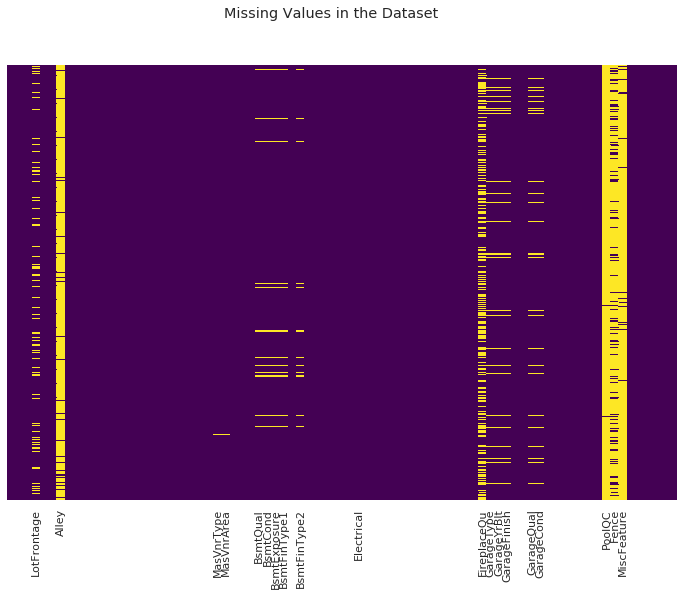

In [9]:
#Display missing values
plt.figure(figsize=(12,8))
plt.suptitle('Missing Values in the Dataset')
sns.heatmap(df2.isnull(), yticklabels=False, xticklabels=label_nas ,cbar = False, cmap='viridis')
plt.show()

* After calculating the number of missing values in each column and displaying them in a way that highlets them, we can clearly see that some features can't be relied on for any meaningfull analysis, I will remove them in the next step.
* Features with less missing data will be filled with either the mean/mode value of the column for numerical/categorical features respectively.

In [10]:
#Remove columns with too many missing values
null_values_per_col = np.sum(df2.drop(["SalePrice"], axis=1).isnull(), axis=0)
max_na = int(df2.shape[0]/5.0) #allowing up to 1/5 (20%) of the data to be missing
cols_to_remove = []

for col in df2.drop(["SalePrice"],axis=1).columns.tolist():
    if null_values_per_col[col] > max_na: 
        cols_to_remove.append(col)
        df2.drop(col, axis=1, inplace=True)
        
print("New shape of the training set is: (%d,%d)" %df2.shape)        
print("The removed columns are: " + str(cols_to_remove))

New shape of the training set is: (1460,76)
The removed columns are: ['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']


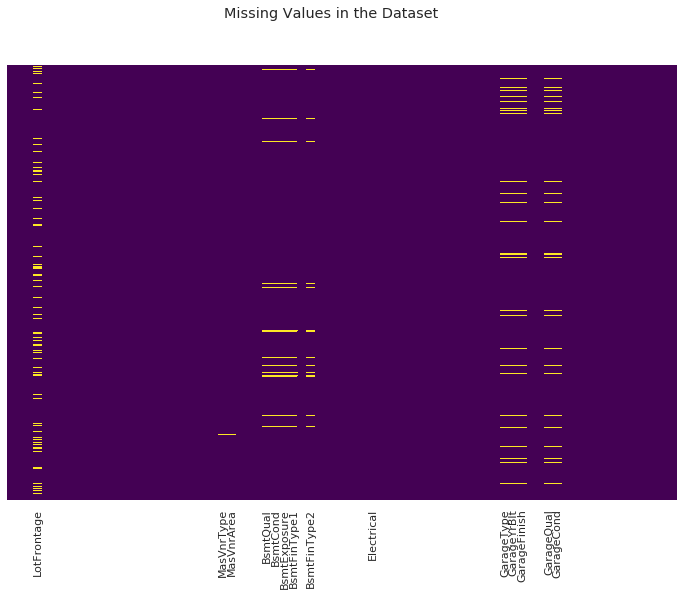

In [11]:
#Display again
label_nas = label_null_mapping(df2)

plt.figure(figsize=(12,8))
plt.suptitle('Missing Values in the Dataset')
sns.heatmap(df2.isnull(), yticklabels=False, xticklabels=label_nas ,cbar = False, cmap='viridis')
plt.show()

In [12]:
col_interest = [x for x in label_nas if x != ""]
print(col_interest)

['LotFrontage', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Electrical', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageQual', 'GarageCond']


In [13]:
# Fill the rest of null values
# With median for numerical, and mode for categorical
df2.fillna(df2.mean(), inplace = True)

for col in col_interest:
    df2[col].fillna(df2[col].mode()[0], inplace = True)

#### Reorganize columns
To better represent categorical data, especially when ordinal

In [14]:
#remap some columns to have numerical data
rep_map_1 = ["NA", "Po", "Fa", "TA", "Gd", "Ex"]
rep_map_2 = ["NA", "No", "Mn", "Av", "Gd"]
rep_map_3 = ["NA", "Unf", "LwQ", "Rec", "BLQ", "ALQ", "GLQ"]
rep_map_4 = ["NA", "MnWw", "GdWo", "MnPrv", "GdPrv"]
rep_map_5 = ["N", "P", "Y"]
rep_map_6 = ["NA", "Unf", "RFn", "Fin"]
rep_map_7 = np.linspace(1,10, 10).astype("int").astype("str").tolist()
rep_map_8 = ["Sev", "Mod", "Gtl"]
rep_map_9 = ["ELO", "NoSeWa", "NoSewr", "AllPub"]
rep_map_10 = ["IR3", "IR2", "IR1", "Reg"]

ordinal_var_dict = {"ExterCond": rep_map_1,
                    "ExterQual": rep_map_1,
                    "BsmtCond": rep_map_1, 
                    "BsmtQual": rep_map_1,
                    "HeatingQC": rep_map_1, 
                    "KitchenQual": rep_map_1, 
                    "GarageCond": rep_map_1,
                    "BsmtExposure": rep_map_2,
                    "BsmtFinType1": rep_map_3,
                    "BsmtFinType2": rep_map_3,
                    "PavedDrive": rep_map_5,
                    "GarageFinish": rep_map_6,
                    #"OverallCond": rep_map_7,
                    #"OverallQual": rep_map_7,
                    "LandSlope": rep_map_8,
                    "Utilities": rep_map_9,
                    "LotShape": rep_map_10,
                   }

cols_ordinal = ["ExterCond",
                    "ExterQual",
                    "BsmtCond", 
                    "BsmtQual",
                    "HeatingQC", 
                    "KitchenQual", 
                    "GarageCond",
                    "BsmtExposure",
                    "BsmtFinType1",
                    "BsmtFinType2",
                    "PavedDrive",
                    "GarageFinish",
                    "LandSlope",
                    "Utilities",
                    "LotShape"]

In [15]:
num_list, cat_list = cat_num_split(df2)

# Reencode ordinal categories
for var in ordinal_var_dict:
    ordered_var = pd.api.types.CategoricalDtype(ordered = True,
                                                categories = ordinal_var_dict[var])
    df2[var] = df2[var].astype(ordered_var)
    
# Reencode the rest
for col in cat_list:
    if col not in ordinal_var_dict:
        df[col] = df[col].astype('category')

* I created a mapping scheme for ordinal categories and kept a list of features meeting this criteria for later use.
* applying the mapping and data type conversion gives us the following DataFrame:

In [16]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Id             1460 non-null   int64   
 1   MSSubClass     1460 non-null   object  
 2   MSZoning       1460 non-null   object  
 3   LotFrontage    1460 non-null   float64 
 4   LotArea        1460 non-null   int64   
 5   Street         1460 non-null   object  
 6   LotShape       1460 non-null   category
 7   LandContour    1460 non-null   object  
 8   Utilities      1460 non-null   category
 9   LotConfig      1460 non-null   object  
 10  LandSlope      1460 non-null   category
 11  Neighborhood   1460 non-null   object  
 12  Condition1     1460 non-null   object  
 13  Condition2     1460 non-null   object  
 14  BldgType       1460 non-null   object  
 15  HouseStyle     1460 non-null   object  
 16  OverallQual    1460 non-null   int64   
 17  OverallCond    1460 non-null   in

In [17]:
num_list, cat_list = cat_num_split(df2)

* Using some loops and pairplot features, we can obtain enough graphics to better understand the data and the distribution of each of its features.

#### Numerical Features

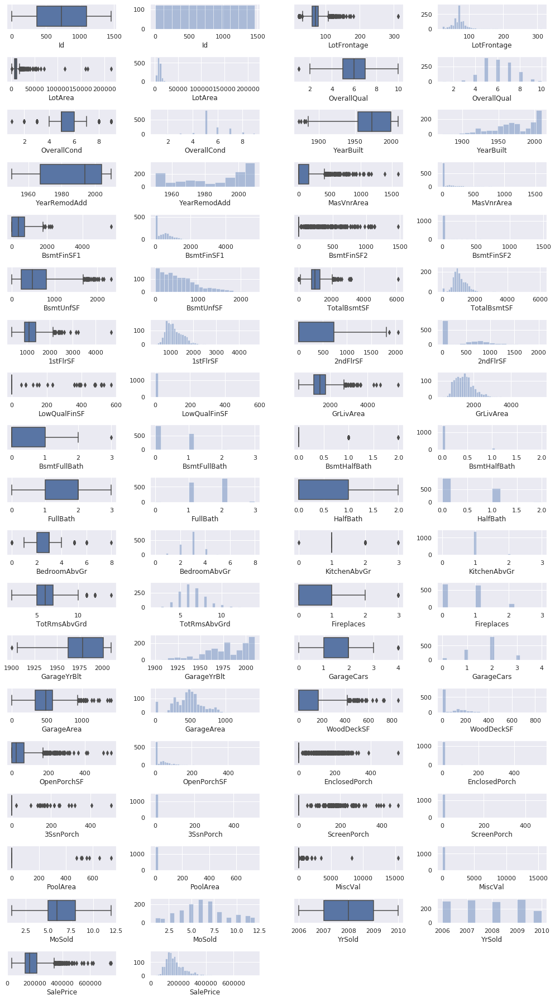

In [18]:
f = plt.figure(figsize=(14, 48))
gs = f.add_gridspec(len(num_list), 4)
for i, col in enumerate(num_list):
    ix, iy= int(i/2), (2 if i%2 else 0)
    ax = f.add_subplot(gs[ix,iy])
    ax = sns.boxplot(df2[col]);
    ax = f.add_subplot(gs[ix,iy+1])
    ax = sns.distplot(df2[col], kde=False);
        
f.tight_layout()

#### Categorical Features (Ordinal)

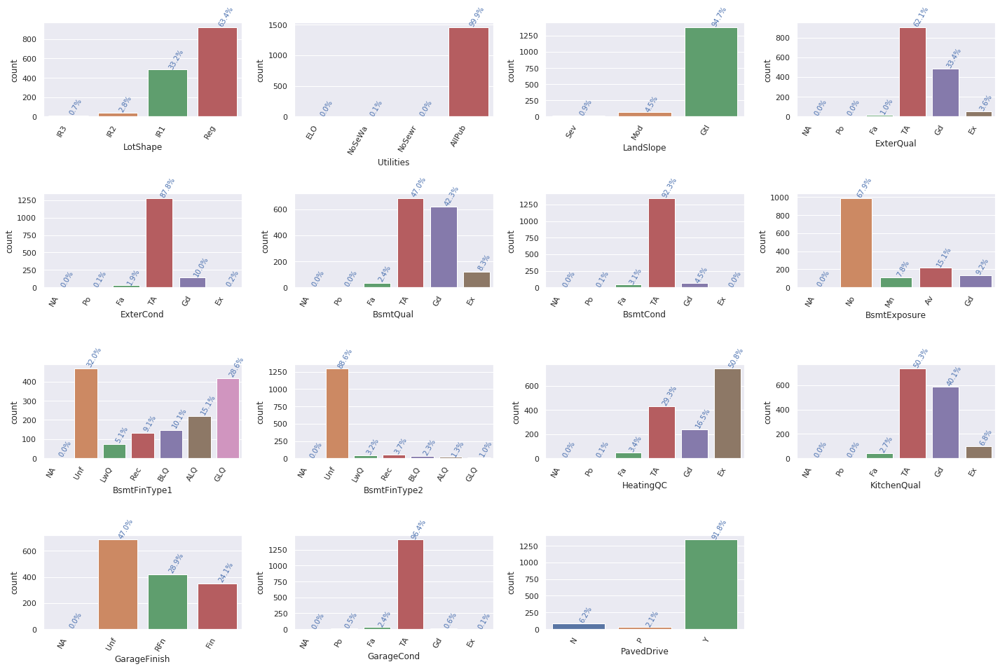

In [19]:
cols_interest = [x for x in cat_list if x in cols_ordinal]

f = plt.figure(figsize=(20, 50))
gs = f.add_gridspec(len(cols_interest), 4)
for i, col in enumerate(cols_interest):
    ax = f.add_subplot(gs[int(i/4),i%4])
    #sns.boxplot(df2[col], kind="box");
    ax = sns.countplot(df2[col])
    ax.set_xticklabels(ax.get_xticklabels(), ha = 'right', rotation=60)
    #sns.distplot(df2[col], kde=False);
    # add annotations
    n_points = df.shape[0]
    col_counts = df2[col].value_counts()
    locs, labels = plt.xticks() # get the current tick locations and labels

    # loop through each pair of locations and labels
    for loc, label in zip(locs, labels):

        # get the text property for the label to get the correct count
        count = col_counts[label.get_text()]
        pct_string = '{:0.1f}%'.format(100*count/n_points)

        # print the annotation just below the top of the bar
        plt.text(loc, count+10, pct_string, ha = 'left', color = 'b', rotation=60, fontsize=10)
        
f.tight_layout()

#### Categorical Features (Nominal)

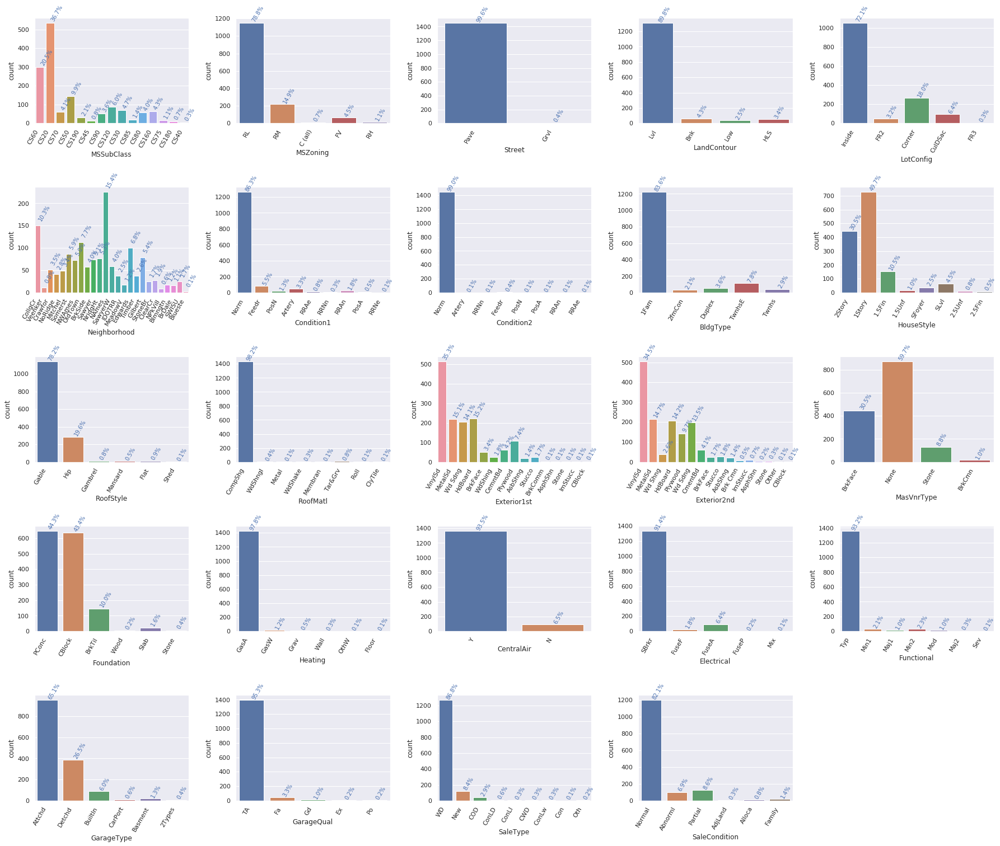

In [20]:
cols_interest = [x for x in cat_list if not (x in cols_ordinal)]

f = plt.figure(figsize=(25, 100))
gs = f.add_gridspec(len(cols_interest), 5)
for i, col in enumerate(cols_interest):
    ax = f.add_subplot(gs[int(i/5),i%5])
    #sns.boxplot(df2[col], kind="box");
    ax = sns.countplot(df2[col])
    ax.set_xticklabels(ax.get_xticklabels(), ha = 'right', rotation=60)
    #sns.distplot(df2[col], kde=False);
    # add annotations
    n_points = df.shape[0]
    col_counts = df2[col].value_counts()
    locs, labels = plt.xticks() # get the current tick locations and labels

    # loop through each pair of locations and labels
    for loc, label in zip(locs, labels):

        # get the text property for the label to get the correct count
        count = col_counts[label.get_text()]
        pct_string = '{:0.1f}%'.format(100*count/n_points)

        # print the annotation just below the top of the bar
        plt.text(loc, count+10, pct_string, ha = 'left', color = 'b', rotation=60, fontsize=10)
        
f.tight_layout()

* I made 3 grids for better readability, one for each of numerical features, ordinal categories and nominal categories
* Many variables in both numerical and categorical form are severly unbalanced, with ~95% of the values falling in one category or value and the rest being mostly outliers, These won't help us draw any conclusions from their effect on the `SalePrice` and we will get rid of them in the next step

In [21]:
num_to_drop = ['Id', 'LowQualFinSF', '3SsnPorch', 'PoolArea', 'BsmtFinSF2', 'BsmtHalfBath', 'KitchenAbvGr', 'EnclosedPorch', 'ScreenPorch', 'MiscVal']
cat_to_drop = ['Street', 'Utilities', 'LandSlope', 'Condition2', 'RoofMatl', 'Heating', 'GarageQual', 'GarageCond']

df2 = df2.drop(num_to_drop + cat_to_drop, axis=1)

#### Skewness Analysis and Normalization

* `MoSold` is a periodic value, where **12** should be interpreted as closer to **1** than to **10**. That's why it is better to apply a trigonometric transform to it if we try to fit a model to this data but that's beyond the scope of the project so I will skip it.

* `SalePrice` and other numerical features are very skewed, will need a log transform to make them as close to a normal distribution as possible. I will start by visualising that aspect in `SalePrice` then proceed to fix it as well as the other features, and replot everything at the end.

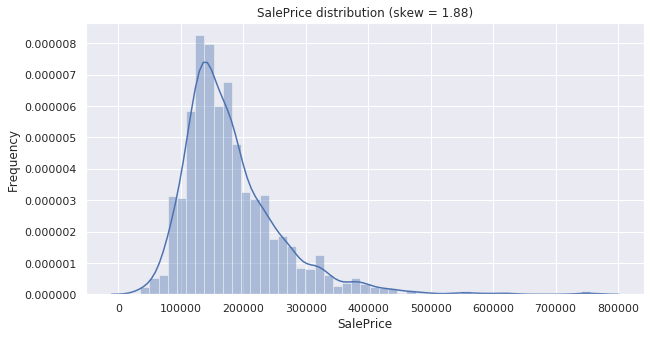

In [22]:
#Check the skewness of SalePrice
skewness = df2['SalePrice'].skew()

f, ax = plt.subplots(figsize=(10, 5))
sns.distplot(df2['SalePrice'], color="b", kde=True);
ax.set(ylabel="Frequency")
ax.set(xlabel="SalePrice")
ax.set(title="SalePrice distribution (skew = {})".format(round(skewness,2)))
plt.show()

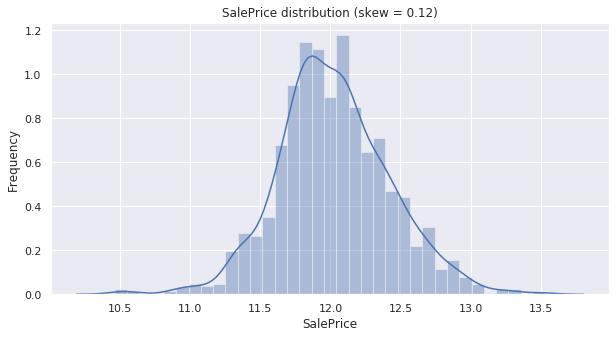

In [23]:
#Apply log1p to reduce skewness
skewness = np.log1p(df2['SalePrice']).skew()

f, ax = plt.subplots(figsize=(10, 5))
sns.distplot(np.log1p(df2['SalePrice']), color="b");
ax.set(ylabel="Frequency")
ax.set(xlabel="SalePrice")
ax.set(title="SalePrice distribution (skew = {})".format(round(skewness,2)))
plt.show()

* We can see a significant improvement to the distribution of `SalePrice`, we will apply the same transform to all skewed numerical data

In [24]:
num_list, cat_list = cat_num_split(df2)

# Log transform of the skewed numerical features to lessen impact of outliers
skewness = df2[num_list].skew()
skewness = skewness[abs(skewness) > 0.6]
print(str(skewness.shape[0]) + " skewed numerical features to log transform")
skewed_features = skewness.index
print(skewed_features)
df2[skewed_features] = np.log1p(df2[skewed_features])


18 skewed numerical features to log transform
Index(['LotFrontage', 'LotArea', 'OverallCond', 'YearBuilt', 'MasVnrArea',
       'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'HalfBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt',
       'WoodDeckSF', 'OpenPorchSF', 'SalePrice'],
      dtype='object')


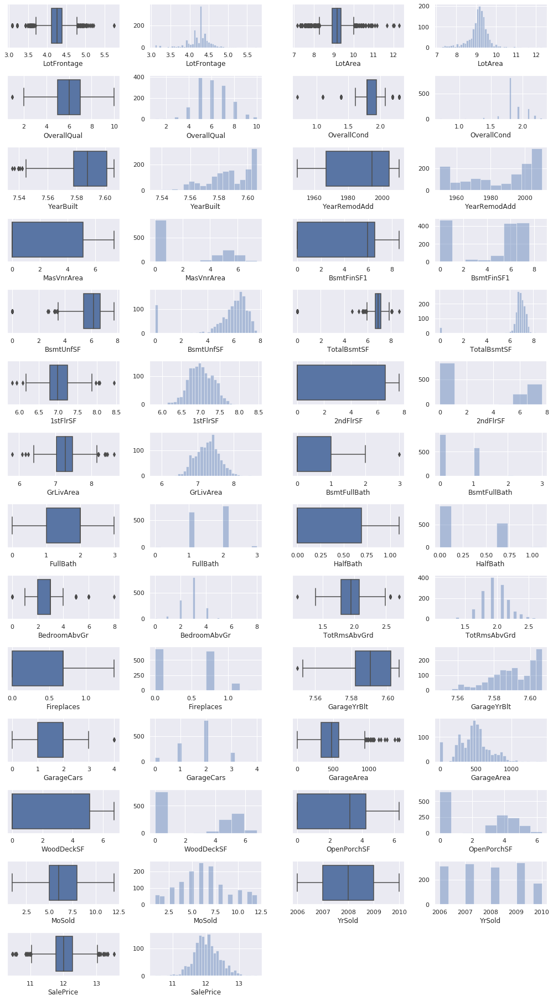

In [25]:
f = plt.figure(figsize=(14, 48))
gs = f.add_gridspec(len(num_list), 4)
for i, col in enumerate(num_list):
    ix, iy= int(i/2), (2 if i%2 else 0)
    ax = f.add_subplot(gs[ix,iy])
    ax = sns.boxplot(df2[col]);
    ax = f.add_subplot(gs[ix,iy+1])
    ax = sns.distplot(df2[col], kde=False);
        
f.tight_layout()

* This grid shows that the trasform successfully improved the distribution of the data

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?

* Many of the variables in this dataset had skewed distributions, the most sever of which were simply removed, while the rest can be normalized.

### Of the features you investigated, were there any unusual distributions? Did you perform any operations on the data to tidy, adjust, or change the form of the data? If so, why did you do this?

* `SalePrice` and several other variables were skewed, I need to normalize them by applying `np.log1p`.
* `MoSale` could also be transformed to better show its periodic nature, but that's not needed for this project.
* The sever ones also happened to be the ones with the highest numbers of outliers.

## Bivariate Exploration

> In this section, investigate relationships between pairs of variables in your
data. Make sure the variables that you cover here have been introduced in some
fashion in the previous section (univariate exploration).

#### Finding Correlations

In [26]:
#Correlation matrix
corr_mat = df2.corr().abs()
# Find most important features relative to target
corr_mat.sort_values(["SalePrice"], ascending = False, inplace = True)
print(corr_mat.SalePrice)
cols_top_corr = corr_mat.SalePrice.index[1:13].tolist()

SalePrice       1.000000
OverallQual     0.817185
GrLivArea       0.730254
GarageCars      0.680625
GarageArea      0.650888
1stFlrSF        0.608955
FullBath        0.594771
YearBuilt       0.584443
YearRemodAdd    0.565608
TotRmsAbvGrd    0.539998
Fireplaces      0.508925
GarageYrBlt     0.498631
OpenPorchSF     0.459948
MasVnrArea      0.420330
LotArea         0.399923
TotalBsmtSF     0.372838
LotFrontage     0.346668
WoodDeckSF      0.343039
HalfBath        0.320925
BsmtFullBath    0.236224
BedroomAbvGr    0.209043
BsmtUnfSF       0.208233
BsmtFinSF1      0.208099
2ndFlrSF        0.180778
MoSold          0.057330
YrSold          0.037263
OverallCond     0.001794
Name: SalePrice, dtype: float64


* The previous few lines of code allow us to find the features that are more correlated to the variable in question `SalePrice`. 
* We can do better and find correlation between all numerical variables, and reduce depenency between them accordingly

In [27]:
#Correlation matrix between features
corr_mat = df2.drop(columns=["SalePrice"]).corr().abs()

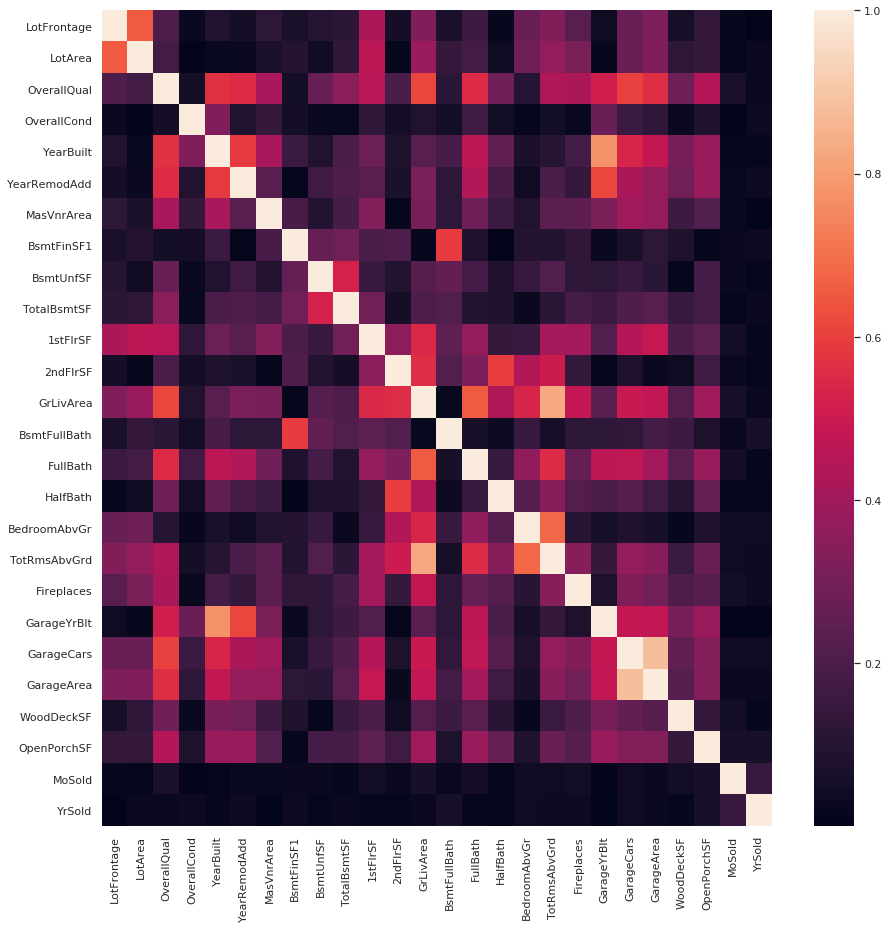

In [28]:
#Plot the heatmap with seaborn
plt.figure(figsize=(15,15)) 
sns.heatmap(corr_mat, 
        xticklabels=corr_mat.columns,
        yticklabels=corr_mat.columns)

* In this heatmap, we can spot a few correlated variables, this kind of relations is undesired if we want to feed the data to a regression model, so let's fix that by removing the most noticeable ones.

In [29]:
#List the highly correlated columns
corr_tmp = corr_mat.unstack()
corr_tmp = corr_tmp.sort_values(kind="quicksort", ascending = True)

print(corr_tmp[-len(corr_mat)-20:-len(corr_mat)])

HalfBath      2ndFlrSF        0.596198
2ndFlrSF      HalfBath        0.596198
OverallQual   GarageCars      0.600671
GarageCars    OverallQual     0.600671
OverallQual   GrLivArea       0.614207
GrLivArea     OverallQual     0.614207
GarageYrBlt   YearRemodAdd    0.616039
YearRemodAdd  GarageYrBlt     0.616039
GrLivArea     FullBath        0.653167
FullBath      GrLivArea       0.653167
LotArea       LotFrontage     0.654004
LotFrontage   LotArea         0.654004
TotRmsAbvGrd  BedroomAbvGr    0.683226
BedroomAbvGr  TotRmsAbvGrd    0.683226
GarageYrBlt   YearBuilt       0.777307
YearBuilt     GarageYrBlt     0.777307
TotRmsAbvGrd  GrLivArea       0.829407
GrLivArea     TotRmsAbvGrd    0.829407
GarageCars    GarageArea      0.882475
GarageArea    GarageCars      0.882475
dtype: float64


In [33]:
corr_to_drop = ["GarageYrBlt", "GarageCars", "GrLivArea", "TotalBsmtSF"]
cols_top_corr = [x for x in cols_top_corr if not (x in corr_to_drop)]
df2 = df2.drop(corr_to_drop, axis=1)

KeyError: "['GarageYrBlt' 'GarageCars' 'GrLivArea' 'TotalBsmtSF'] not found in axis"

#### SalePrice vs Categorical variables

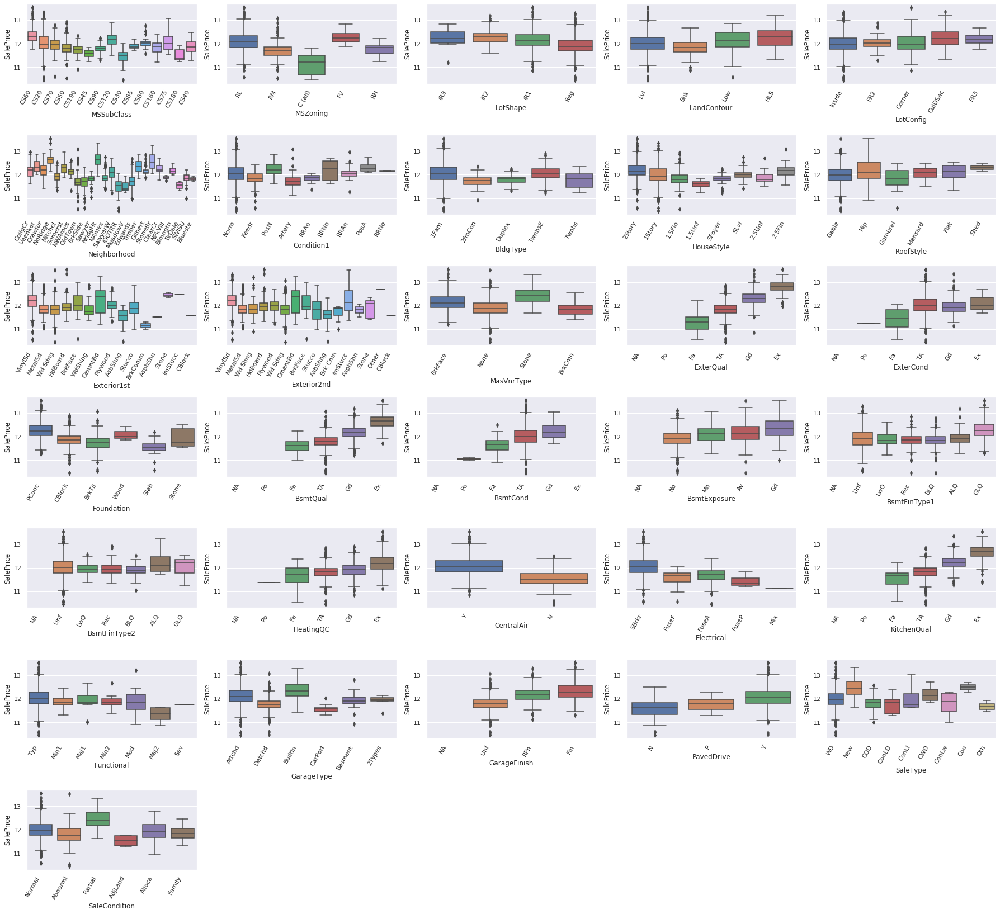

In [31]:
num_list, cat_list = cat_num_split(df2)    
    
f = plt.figure(figsize=(25, 100))
gs = f.add_gridspec(len(cat_list), 5)
for i, col in enumerate(cat_list):
    ax = f.add_subplot(gs[int(i/5),i%5])
    #sns.boxplot(df2[col], kind="box");
    ax = sns.boxplot(x=col, y="SalePrice", data=df2)
    #sns.distplot(df2[col], kde=False);
    ax.set_xticklabels(ax.get_xticklabels(), ha = 'right', rotation=60)
        
f.tight_layout()

#### SalePrice vs Numerical variables

/home/husmen/miniconda3/envs/dand/lib/python3.8/site-packages/seaborn/axisgrid.py:2079: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


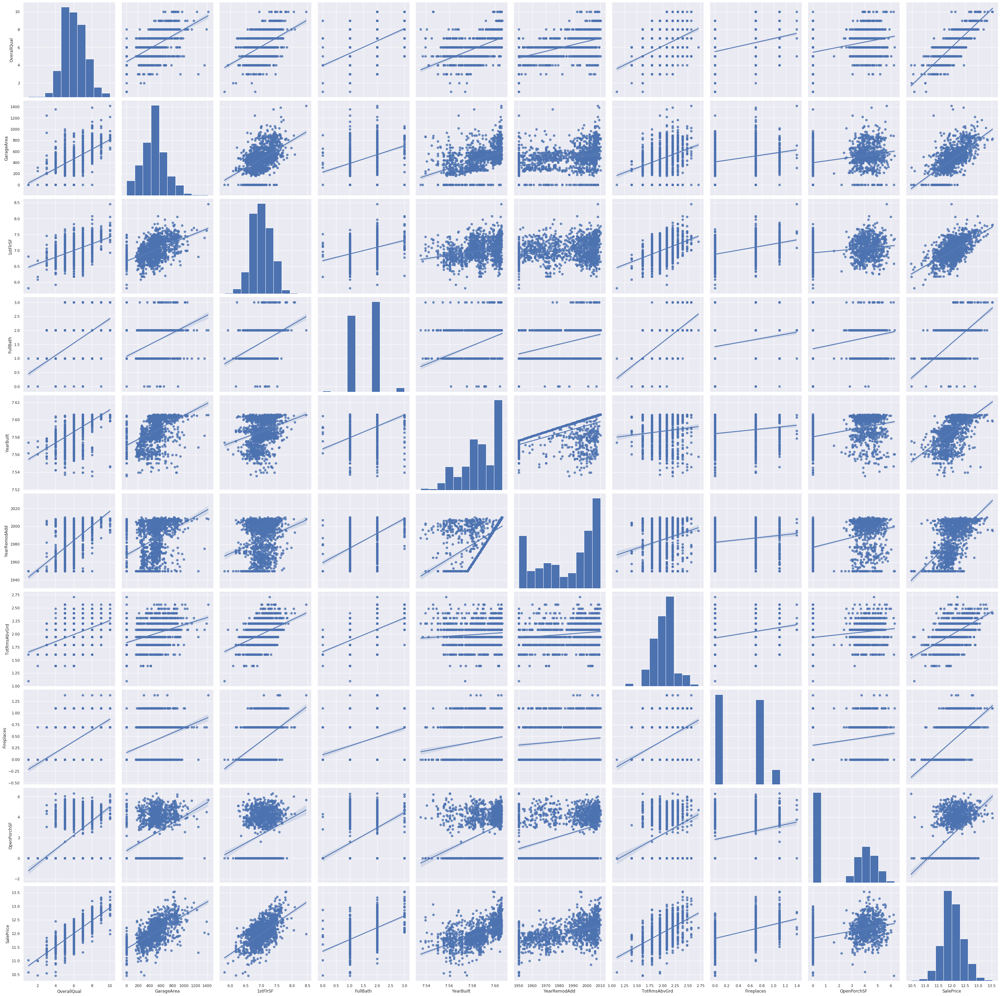

In [34]:
#g = sns.PairGrid(df2[num_list])
#g.map_diag(plt.hist)
#g.map_offdiag(plt.scatter, alpha=0.25);

g = sns.pairplot(df2[cols_top_corr + ['SalePrice']], size=4, kind="reg");

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?

> Your answer here!

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?

> Your answer here!

## Multivariate Exploration

> Create plots of three or more variables to investigate your data even
further. Make sure that your investigations are justified, and follow from
your work in the previous sections.

In [35]:
cols_ordinal = [x for x in df2.columns.tolist() if x in cols_ordinal] # or x in cols_top_corr)]
cols_nominal = [x for x in df2.columns.tolist() if not (x in cols_ordinal)]
cols_interest.append('SalePrice') 
cols_stripplot = ['OverallQual', 'FullBath', 'TotRmsAbvGrd', 'Fireplaces']

In [36]:
f = plt.figure(figsize=(100, 100))
gs = f.add_gridspec(len(cols_top_corr), len(cols_ordinal))
for i, col in enumerate(cols_top_corr):
    for j, col2 in enumerate(cols_ordinal):
        ax = f.add_subplot(gs[i,j])
        #sns.boxplot(df2[col], kind="box");
        #{x, y}_jitter does nothing iwth scatterplot according to docs
        if col in cols_stripplot:
            ax = sns.stripplot(x=col, y="SalePrice", hue=col2, data=df2, alpha = 0.3, jitter = 0.2)
        else:
            ax = sns.scatterplot(x=col, y="SalePrice", hue=col2, data=df2, alpha = 0.3)
        #sns.distplot(df2[col], kde=False);
        #ax.set_xticklabels(ax.get_xticklabels(), ha = 'right', rotation=60)
        
f.tight_layout()

In [ ]:
f = plt.figure(figsize=(100, 100))
gs = f.add_gridspec(len(cols_top_corr), len(cols_nominal))
for i, col in enumerate(cols_top_corr):
    for j, col2 in enumerate(cols_nominal):
        ax = f.add_subplot(gs[i,j])
        if col in cols_stripplot:
            ax = sns.stripplot(x=col, y="SalePrice", hue=col2, data=df2, alpha = 0.3, jitter = 0.2)
        else:
            ax = sns.scatterplot(x=col, y="SalePrice", hue=col2, data=df2, alpha = 0.3)
        
f.tight_layout()

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?

> Your answer here!

### Were there any interesting or surprising interactions between features?

> Your answer here!

> At the end of your report, make sure that you export the notebook as an
html file from the `File > Download as... > HTML` menu. Make sure you keep
track of where the exported file goes, so you can put it in the same folder
as this notebook for project submission. Also, make sure you remove all of
the quote-formatted guide notes like this one before you finish your report!

## References

* Seaborn [Tutorial](https://seaborn.pydata.org/tutorial.html) and [API Docs](https://seaborn.pydata.org/api.html)
* [House Prices: Advanced Regression Techniques | Kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques/)
* [Exploratory Data Analysis of House Price by Siddhesh Pujari](https://www.kaggle.com/siddheshpujari/exploratory-data-analysis-of-house-price)
* [XGBoost Parameter Tuning v2 by Houssem Menhour (myself)](https://www.kaggle.com/husmen/xgboost-parameter-tuning-v2)